### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import chart_studio.plotly as py
import cufflinks as cf
import plotly.express as px
import seaborn as sns
%matplotlib inline

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

### Basics

<AxesSubplot:>

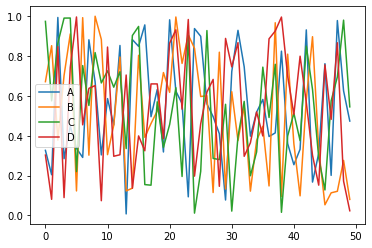

In [3]:
arr_1 = np.random.rand(50,4)
df_1 = pd.DataFrame(arr_1, columns = ['A','B','C','D'])
df_1.head()
df_1.plot()

In [4]:
df_1.iplot()

### Line Plots

In [6]:
import plotly.graph_objects as go
df_stocks = px.data.stocks()
px.line(df_stocks, x = 'date', y = 'GOOG', labels = {'x': 'Date', 'y': 'Price'})

In [7]:
px.line(df_stocks, x = 'date', y = ['GOOG', 'AAPL'], labels = {'x': 'Date', 'y': 'Price'}, title = 'Apple vs. Google')

In [21]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = df_stocks.date, y = df_stocks.AAPL, mode = 'lines', name = 'Apple'))
fig.add_trace(go.Scatter(x = df_stocks.date, y = df_stocks.GOOG, mode = 'lines+markers', name = 'Google'))
fig.add_trace(go.Scatter(x = df_stocks.date, y = df_stocks.AMZN, mode = 'lines+markers', name = 'Amazon', line = dict(color = 
                                                    'firebrick', width = 2, dash = 'dashdot')))
# fig.update_layout(title = 'Stock Price Data 2018-2020', xaxis_title = 'Price', yaxis_title = 'Date')
fig.update_layout(xaxis = dict(showline=True, showgrid=False, showticklabels = True, linecolor='rgb(204,204,204)', linewidth = 
                              2, ticks = 'outside', tickfont = dict(family='Arial', size = 12, color = 'rgb(82,82,82)',),
                              ),
                 yaxis = dict(showgrid=True,
                              zeroline = False,
                              showline = False,
                              showticklabels = False),
                 autosize = False,
                 margin = dict(autoexpand = False, l = 100, r = 20, t = 110,), showlegend = True, plot_bgcolor = 'white')

### Bar Chart

In [20]:
df_us = px.data.gapminder().query("country == 'United States'")
px.bar(df_us, x='year', y = 'pop')

In [22]:
df_tips = px.data.tips()
px.bar(df_tips, x = 'day', y = 'tip', color = 'sex', title = 'Tips', labels = {'tip': 'Tip Amount', 'day': 'Day of the Week'})

In [23]:
px.bar(df_tips, x = 'sex', y = 'total_bill', color = 'smoker', barmode = 'group')

In [25]:
df_europe = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2.e6")
fig = px.bar(df_europe, y = 'pop', x = 'country', text = 'pop', color = 'country')
fig.update_traces(texttemplate = '%{text:.2s}', textposition = 'outside')
fig.update_layout(uniformtext_minsize = 8)
fig.update_layout(xaxis_tickangle = -45)
fig

### Scatter Plots

In [27]:
df_iris = px.data.iris()
px.scatter(df_iris, x = 'sepal_width', y = 'sepal_length', color = 'species', size = 'petal_length', hover_data =
           ['petal_width'])

In [29]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = df_iris.sepal_width, y = df_iris.sepal_length, mode = 'markers', marker_color = df_iris.sepal_width,
                        text = df_iris.species, marker = dict(showscale = True)))
fig.update_traces(marker_line_width = 2, marker_size = 10)

In [31]:
fig = go.Figure(data = go.Scattergl(
x = np.random.randn(100000),
y = np.random.randn(100000),
mode = 'markers',
marker = dict(color = np.random.randn(100000),
             colorscale = 'Viridis',
             line_width = 1)))
fig

### Pie Charts

In [35]:
df_asia = px.data.gapminder().query("year == 2007").query("continent == 'Asia'")
px.pie(df_asia, values = 'pop', names = 'country', title = 'Population of Asian Continent',
      color_discrete_sequence = px.colors.sequential.RdBu)

colors = ['blue', 'green', 'black', 'purple', 'red', 'brown']
fig = go.Figure(data = [go.Pie(labels = ['Water', 'Grass', 'Normal', 'Psychic', 'Fire', 'ground'])])
fig

In [36]:
fig.update_traces(hoverinfo = 'label + percent', textfont_size = 20, textinfo = 'label + percent', pull = [0.1,0,0.2,0,0,0],
                 marker = dict(colors = colors, line = dict(color = '#FFFFFF', width = 2)))
fig

### Histograms

In [38]:
dice_1 = np.random.randint(1,7,5000)
dice_2 = np.random.randint(1,7,5000)
dice_sum = dice_1 + dice_2
fig = px.histogram(dice_sum, nbins = 11,
                  labels = {'value': 'Dice Roll'},
                  title = '5000 Dice Roll Histogram',
                  marginal = 'violin',
                  color_discrete_sequence = ['green'])
fig

In [39]:
fig.update_layout(xaxis_title_text = 'Dice Roll',
                 yaxis_title_text = 'Dice Sum',
                 bargap = 0.2,
                 showlegend = False)
fig

In [43]:
df_tips = px.data.tips()
px.histogram(df_tips, x = 'total_bill', color = 'sex')


### Box Plots

In [45]:
df_tips = px.data.tips()
px.box(df_tips, x = 'sex', y = 'tip', points = 'all')

In [46]:
px.box(df_tips, x = 'day', y = 'tip', color = 'sex')

In [47]:
fig = go.Figure()
fig.add_trace(go.Box(x = df_tips.sex, y = df_tips.tip,
                    marker_color = 'blue',
                    boxmean = 'sd'))


In [48]:
df_stocks = px.data.stocks()
fig = go.Figure()
fig.add_trace(go.Box(y = df_stocks.GOOG, boxpoints = 'all',
                    fillcolor = 'blue',
                    jitter = 0.5,
                    whiskerwidth = 0.2))
fig.add_trace(go.Box(y = df_stocks.AAPL, boxpoints = 'all',
                    fillcolor = 'red',
                    jitter = 0.5,
                    whiskerwidth = 0.2))
fig.update_layout(title = 'Google vs. Apple',
                 yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                             gridwidth=3),
                 paper_bgcolor = 'rgb(243, 243, 243)',
                 plot_bgcolor = 'rgb(243, 243, 243)')

### Violin Plots

In [50]:
df_tips = px.data.tips()
px.violin(df_tips, y = 'total_bill', box = True, points = 'all')

In [51]:
px.violin(df_tips, y = "tip", x = "smoker", color = "sex", box = True, points = "all", hover_data = df_tips.columns)

In [53]:
fig = go.Figure()
fig.add_trace(go.Violin(x = df_tips['day'][df_tips['smoker'] == 'Yes'],
                       y = df_tips['total_bill'][df_tips['smoker'] =='Yes'],
                       legendgroup = 'Yes', scalegroup = 'Yes', name = 'Yes', side = 'negative', line_color = 'blue'))
fig.add_trace(go.Violin(x = df_tips['day'][df_tips['smoker'] == 'No'],
                       y = df_tips['total_bill'][df_tips['smoker'] =='No'],
                       legendgroup = 'Yes', scalegroup = 'Yes', name = 'No', side = 'positive', line_color = 'red'))

### Density Heatmaps

In [54]:
flights = sns.load_dataset("flights")
fig = px.density_heatmap(flights, x = 'year', y = 'month', z = 'passengers', color_continuous_scale = 'Viridis')

In [55]:
fig

In [56]:
fig = px.density_heatmap(flights, x = 'year', y = 'month', z = 'passengers', marginal_x = 'histogram', marginal_y = 'histogram')
fig

### 3D Scatter Plots

In [59]:
fig = px.scatter_3d(flights, x = 'year', y = 'month', z = 'passengers', color = 'year', opacity = 0.9)
fig

### 3D Line Plots

In [60]:
fig = px.line_3d(flights, x = 'year', y = 'month', z = 'passengers', color = 'year')
fig

### Scatter Matrix

In [62]:
fig = px.scatter_matrix(flights, color = 'month')
fig

### Map Scatter Plots

In [63]:
df = px.data.gapminder().query("year == 2007")
fig = px.scatter_geo(df, locations = "iso_alpha", color = "continent", hover_name = "country", size = "pop", projection = "orthographic")
fig

### Polar Charts

In [64]:
df_wind = px.data.wind()
px.scatter_polar(df_wind, r = "frequency", theta = "direction", color = "strength", size = "frequency", symbol = "strength")

In [65]:
df_wind = px.data.wind()
px.line_polar(df_wind, r = "frequency", theta = "direction", color = "strength", line_close = True, template = "plotly_dark")

### Ternary Plots

In [66]:
df_exp = px.data.experiment()
px.scatter_ternary(df_exp, a = "experiment_1", b = "experiment_2", c = "experiment_3", hover_name = "group", color = "gender")

### Facet Plots

In [69]:
df_tips = px.data.tips()
px.scatter(df_tips, x = "total_bill", y = "tip", color = "smoker", facet_col = "sex")

### Animated Plots

In [70]:
df_cnt = px.data.gapminder()
px.scatter(df_cnt, x = "gdpPercap", y = "lifeExp", animation_frame = "year", animation_group = "country", size = "pop",
          color = "continent", hover_name = "country", log_x = True, size_max = 55, range_x = [100, 100000], range_y = [25,90])

In [ ]:
px.bar(df_cnt, x = "continent", y = "pop", color = "continent", animation_frame = "year", animation_group = "country", range_y = [0, 400])